<a href="https://colab.research.google.com/github/paulzrq/687-project/blob/main/BIS_687_Project.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split
#import sweetviz as sv

# **BIS 687 Project**


In [ ]:
#use sqlite3 to store intermediate query results
import sqlite3

# Step 2: Establish a connection to the in-memory database
conn = sqlite3.connect(':memory:')

# Step 3: Perform database operations
cursor = conn.cursor()


In [ ]:
# configure connection to BigQuery
from google.colab import auth
from google.cloud import bigquery
from google.colab import data_table

project = 'clinical-entity-extraction'
location = 'US'
client = bigquery.Client(project=project, location=location)
data_table.enable_dataframe_formatter()
auth.authenticate_user()

# 1. For those diagnosed 'Hypertension NOS', analyze whether age, gender, admission type, insurance, religion, marital status, ethnicity correlate with LOS (length of stay) in the ICU

### Data Preprocessing

In [ ]:
sql_query = ('''



SELECT dd.short_title AS diagnosis_name,count(dd.short_title) as value

FROM
    `physionet-data.mimiciii_clinical.patients` p
JOIN
    `physionet-data.mimiciii_clinical.admissions` adm ON p.subject_id = adm.subject_id
JOIN
    `physionet-data.mimiciii_clinical.diagnoses_icd`  di ON p.subject_id = di.subject_id
JOIN
    `physionet-data.mimiciii_clinical.d_icd_diagnoses` dd ON di.icd9_code = dd.icd9_code
JOIN
    `physionet-data.mimiciii_clinical.icustays` icu ON adm.hadm_id = icu.hadm_id
group by diagnosis_name
order by value desc

''')
df = client.query(sql_query).to_dataframe()
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6769 entries, 0 to 6768
Data columns (total 2 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   diagnosis_name  6769 non-null   object
 1   value           6769 non-null   Int64 
dtypes: Int64(1), object(1)
memory usage: 112.5+ KB


In [ ]:
# blood pressure measure
sql_query = '''
SELECT p.SUBJECT_ID,adm.ETHNICITY,max(ce.valuenum) as value
FROM
    `physionet-data.mimiciii_clinical.patients` p
JOIN
    `physionet-data.mimiciii_clinical.admissions` adm ON p.subject_id = adm.subject_id
JOIN
    `physionet-data.mimiciii_clinical.diagnoses_icd`  di ON p.subject_id = di.subject_id
JOIN
    `physionet-data.mimiciii_clinical.d_icd_diagnoses` dd ON di.icd9_code = dd.icd9_code
JOIN
    `physionet-data.mimiciii_clinical.chartevents` ce ON adm.hadm_id = ce.hadm_id
JOIN
    `physionet-data.mimiciii_clinical.d_items` d_items  ON ce.itemid = d_items.itemid

WHERE
    p.SUBJECT_ID not in (
      select p.SUBJECT_ID
      from `physionet-data.mimiciii_clinical.patients` p
      join `physionet-data.mimiciii_clinical.diagnoses_icd`  di ON p.subject_id = di.subject_id
      join `physionet-data.mimiciii_clinical.d_icd_diagnoses` dd ON di.icd9_code = dd.icd9_code
      where dd.short_title = 'Hypertension NOS'
      )
    AND ce.itemid IN (220052, 220181,224167,224643)
    AND ce.valuenum IS NOT NULL
    AND ce.valuenum < 250
    AND ce.valuenum > 0
GROUP BY
    p.SUBJECT_ID,adm.ETHNICITY
    '''
df = client.query(sql_query).to_dataframe()
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9393 entries, 0 to 9392
Data columns (total 3 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   SUBJECT_ID  9393 non-null   Int64  
 1   ETHNICITY   9393 non-null   object 
 2   value       9393 non-null   float64
dtypes: Int64(1), float64(1), object(1)
memory usage: 229.4+ KB


In [ ]:
df

,SUBJECT_ID,ETHNICITY,value
0,87547,WHITE,118.0
1,65565,WHITE,180.0
2,1709,WHITE,161.0
3,74857,HISPANIC OR LATINO,157.0
4,53194,UNABLE TO OBTAIN,136.0
...,...,...,...
9388,97922,HISPANIC/LATINO - SALVADORAN,84.0
9389,77766,BLACK/AFRICAN,86.0
9390,57239,WHITE,94.0
9391,93058,WHITE,101.0


In [ ]:
df['type'] = 'Non_hypertension'
df.head()

,SUBJECT_ID,ETHNICITY,value,type
0,87547,WHITE,118.0,Non_hypertension
1,65565,WHITE,180.0,Non_hypertension
2,1709,WHITE,161.0,Non_hypertension
3,74857,HISPANIC OR LATINO,157.0,Non_hypertension
4,53194,UNABLE TO OBTAIN,136.0,Non_hypertension


In [ ]:
df

,SUBJECT_ID,ETHNICITY,value,type
0,87547,WHITE,118.0,Non_hypertension
1,65565,WHITE,180.0,Non_hypertension
2,1709,WHITE,161.0,Non_hypertension
3,74857,HISPANIC OR LATINO,157.0,Non_hypertension
4,53194,UNABLE TO OBTAIN,136.0,Non_hypertension
...,...,...,...,...
9388,97922,HISPANIC/LATINO - SALVADORAN,84.0,Non_hypertension
9389,77766,BLACK/AFRICAN,86.0,Non_hypertension
9390,57239,WHITE,94.0,Non_hypertension
9391,93058,WHITE,101.0,Non_hypertension


In [ ]:
df.describe()

,SUBJECT_ID,value
count,9393.0,9393.000000
mean,65339.847865,116.514958
std,21798.164406,32.419784
min,34.0,29.000000
25%,50547.0,96.000000
50%,66419.0,109.000000
75%,83208.0,126.000000
max,99995.0,249.000000


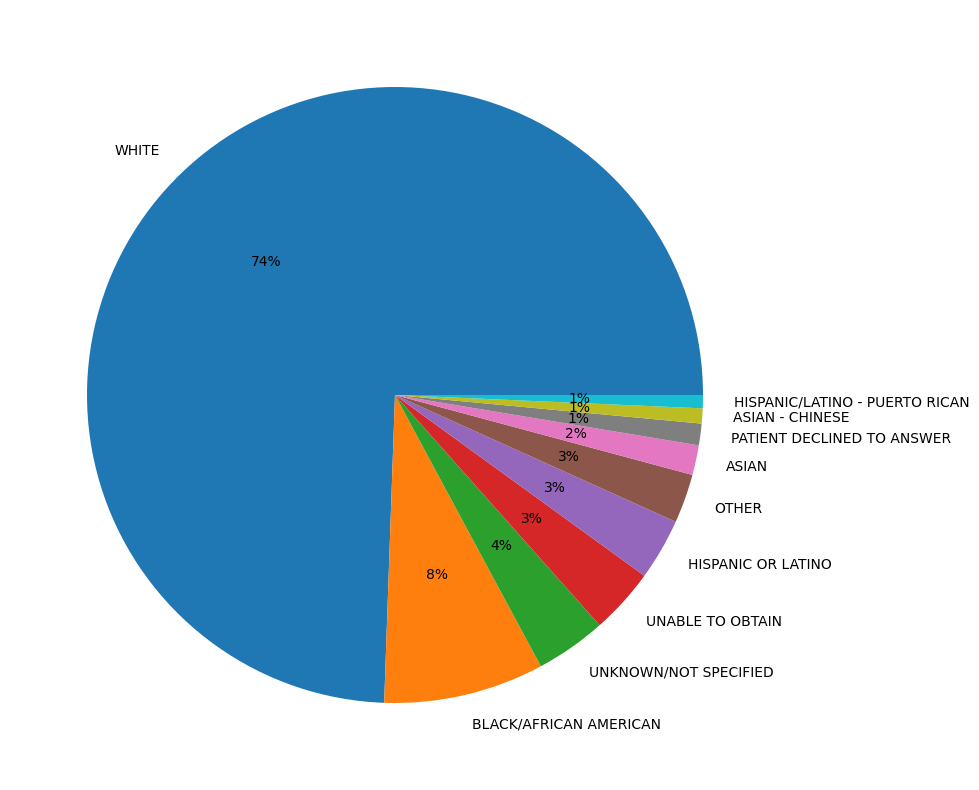

In [ ]:
fig= plt.subplots(figsize=(20,10))
ethnicity_counts = df['ETHNICITY'].value_counts()
ethnicity_table = ethnicity_counts.reset_index()
ethnicity_table.columns = ['Ethnicity', 'Count']  # Rename columns appropriately

plt.pie(ethnicity_table['Count'][0:10], labels=ethnicity_table['Ethnicity'][0:10],autopct='%.0f%%')
plt.show()

In [ ]:

#query MIMIC III full dataset to join patients, admissions, and icustays tables
#comparing a patient’s admit date to their altered date of birth give an age-on-admission.
#patients over the age of 89 are given a non-specific age greater than 299 years old, we will record those with value of 99
sql_query = ('''

SELECT p.SUBJECT_ID, p.GENDER, adm.ADMISSION_TYPE, adm.INSURANCE, adm.RELIGION, adm.MARITAL_STATUS, adm.ETHNICITY,
icu.LOS,
dd.short_title AS diagnosis_name,ce.valuenum as value,d_items.label as item_label,
CASE
        WHEN date_diff(adm.ADMITTIME, p.DOB, year)> 89 THEN 99
        ELSE date_diff(adm.ADMITTIME, p.DOB, year)
    END AS AGE,
avg(CASE
        WHEN adm.DEATHTIME IS NOT NULL THEN 1
        ELSE 0
    END) AS Death
FROM
    `physionet-data.mimiciii_clinical.patients` p
JOIN
    `physionet-data.mimiciii_clinical.admissions` adm ON p.subject_id = adm.subject_id
JOIN
    `physionet-data.mimiciii_clinical.diagnoses_icd`  di ON p.subject_id = di.subject_id
JOIN
    `physionet-data.mimiciii_clinical.d_icd_diagnoses` dd ON di.icd9_code = dd.icd9_code
JOIN
    `physionet-data.mimiciii_clinical.icustays` icu ON adm.hadm_id = icu.hadm_id
JOIN
    `physionet-data.mimiciii_clinical.chartevents` ce ON adm.hadm_id = ce.hadm_id
JOIN
    `physionet-data.mimiciii_clinical.d_items` d_items  ON ce.itemid = d_items.itemid

WHERE
    dd.short_title = "Hypertension NOS"
    AND ((d_items.label in ('Non Invasive Blood Pressure mean','Arterial Blood Pressure mean')
    AND ce.valuenum IS NOT NULL
    AND ce.valuenum < 250
    AND ce.valuenum > 0)
    OR
    (d_items.label in ('Platelet Count','Hemoglobin','Red Blood C(3.6-6.2)','Creatinine','Packed Red Blood Cells','BUN')))
GROUP BY
     p.SUBJECT_ID, p.GENDER, adm.ADMISSION_TYPE, adm.INSURANCE, adm.RELIGION, adm.MARITAL_STATUS, adm.ETHNICITY,diagnosis_name,item_label,icu.LOS,AGE,ce.valuenum
'''
)
df_1_many = client.query(sql_query).to_dataframe()
df_1_many.head(10)


,SUBJECT_ID,GENDER,ADMISSION_TYPE,INSURANCE,RELIGION,MARITAL_STATUS,ETHNICITY,LOS,diagnosis_name,value,item_label,AGE,Death
0,25699,M,EMERGENCY,Private,CATHOLIC,MARRIED,WHITE,4.6375,Hypertension NOS,1.0,Creatinine,39,0.0
1,90658,F,EMERGENCY,Medicaid,EPISCOPALIAN,SINGLE,OTHER,1.6802,Hypertension NOS,74.0,Arterial Blood Pressure mean,34,0.0
2,71814,M,EMERGENCY,Private,NOT SPECIFIED,MARRIED,WHITE,3.7746,Hypertension NOS,80.0,Non Invasive Blood Pressure mean,39,0.0
3,99052,M,EMERGENCY,Medicaid,NOT SPECIFIED,SINGLE,UNKNOWN/NOT SPECIFIED,26.7171,Hypertension NOS,92.0,Non Invasive Blood Pressure mean,37,0.0
4,91219,M,EMERGENCY,Government,NOT SPECIFIED,SINGLE,WHITE,3.8977,Hypertension NOS,101.0,Arterial Blood Pressure mean,40,0.0
5,25225,F,EMERGENCY,Medicare,PROTESTANT QUAKER,MARRIED,BLACK/AFRICAN AMERICAN,11.8752,Hypertension NOS,144.0,Platelet Count,31,0.0
6,46935,M,EMERGENCY,Medicaid,CATHOLIC,SINGLE,WHITE,2.7574,Hypertension NOS,8.3,Hemoglobin,39,1.0
7,25699,M,EMERGENCY,Private,CATHOLIC,MARRIED,WHITE,4.6375,Hypertension NOS,8.0,BUN,39,0.0
8,74835,M,EMERGENCY,Medicare,CATHOLIC,SINGLE,WHITE,2.0530,Hypertension NOS,0.9,Creatinine,37,0.0
9,74835,M,EMERGENCY,Medicare,CATHOLIC,SINGLE,WHITE,2.3986,Hypertension NOS,0.9,Creatinine,37,0.0


In [ ]:
df_1_many_hyper = df_1_many[df_1_many.item_label.isin(['Non Invasive Blood Pressure mean','Arterial Blood Pressure mean'])]
df_1_many_other = df_1_many[~df_1_many.item_label.isin (['Non Invasive Blood Pressure mean','Arterial Blood Pressure mean'])]
df_1_hyper = df_1_many_hyper.groupby(['SUBJECT_ID','GENDER','ADMISSION_TYPE','INSURANCE','RELIGION','MARITAL_STATUS','ETHNICITY','LOS','AGE','diagnosis_name','Death'],as_index = False)['value'].max()
df_1_other = df_1_many_other.groupby(['SUBJECT_ID','GENDER','ADMISSION_TYPE','INSURANCE','RELIGION','MARITAL_STATUS','ETHNICITY','LOS','AGE','diagnosis_name','Death','item_label'],as_index = False)['value'].mean()
df_1_other.head(20)

,SUBJECT_ID,GENDER,ADMISSION_TYPE,INSURANCE,RELIGION,MARITAL_STATUS,ETHNICITY,LOS,AGE,diagnosis_name,Death,item_label,value
0,12,M,ELECTIVE,Medicare,JEWISH,MARRIED,WHITE,7.6348,72,Hypertension NOS,1.0,BUN,33.142857
1,12,M,ELECTIVE,Medicare,JEWISH,MARRIED,WHITE,7.6348,72,Hypertension NOS,1.0,Creatinine,1.380000
2,12,M,ELECTIVE,Medicare,JEWISH,MARRIED,WHITE,7.6348,72,Hypertension NOS,1.0,Hemoglobin,12.425000
3,18,M,EMERGENCY,Private,CATHOLIC,MARRIED,WHITE,1.2885,51,Hypertension NOS,0.0,BUN,11.000000
4,18,M,EMERGENCY,Private,CATHOLIC,MARRIED,WHITE,1.2885,51,Hypertension NOS,0.0,Creatinine,0.950000
5,18,M,EMERGENCY,Private,CATHOLIC,MARRIED,WHITE,1.2885,51,Hypertension NOS,0.0,Hemoglobin,14.700000
6,20,F,ELECTIVE,Medicare,CATHOLIC,WIDOWED,WHITE,1.0508,76,Hypertension NOS,0.0,Hemoglobin,9.500000
7,23,M,ELECTIVE,Medicare,CATHOLIC,MARRIED,WHITE,1.2641,71,Hypertension NOS,0.0,BUN,14.500000
8,23,M,ELECTIVE,Medicare,CATHOLIC,MARRIED,WHITE,1.2641,71,Hypertension NOS,0.0,Creatinine,0.700000
9,23,M,ELECTIVE,Medicare,CATHOLIC,MARRIED,WHITE,1.2641,71,Hypertension NOS,0.0,Hemoglobin,9.300000


In [ ]:
df_other = df_1_other.pivot_table(index = 'SUBJECT_ID',columns = ['item_label'],values = 'value',aggfunc = 'mean').reset_index()
df_other.head(20)

item_label,SUBJECT_ID,BUN,Creatinine,Hemoglobin,Platelet Count
0,12,33.142857,1.380000,12.425000,NaN
1,18,11.000000,0.950000,14.700000,NaN
2,20,NaN,NaN,9.500000,NaN
3,23,14.250000,0.675000,11.275000,193.5
4,25,38.250000,1.133333,10.614286,NaN
5,30,NaN,NaN,9.450000,NaN
6,31,18.500000,0.975000,9.925000,NaN
7,35,11.666667,0.650000,9.637500,NaN
8,36,19.166667,1.061111,10.953535,187.8
9,41,21.400000,34.900000,9.600000,NaN


In [ ]:
df_1 = pd.merge(left = df_1_hyper,right = df_other,on = 'SUBJECT_ID',how = 'inner').reset_index(drop = True)
df_1.tail()

,SUBJECT_ID,GENDER,ADMISSION_TYPE,INSURANCE,RELIGION,MARITAL_STATUS,ETHNICITY,LOS,AGE,diagnosis_name,Death,value,BUN,Creatinine,Hemoglobin,Platelet Count
10995,99965,M,EMERGENCY,Medicare,PROTESTANT QUAKER,MARRIED,WHITE,1.7262,66,Hypertension NOS,0.0,102.0,13.0,0.90,9.10,226.000000
10996,99966,M,EMERGENCY,Medicare,NOT SPECIFIED,MARRIED,WHITE,1.7034,77,Hypertension NOS,0.0,93.0,22.0,1.35,12.30,141.500000
10997,99983,M,EMERGENCY,Medicare,PROTESTANT QUAKER,MARRIED,UNKNOWN/NOT SPECIFIED,1.0399,79,Hypertension NOS,0.0,100.0,15.5,1.15,12.75,222.333333
10998,99992,F,EMERGENCY,Medicare,CATHOLIC,WIDOWED,WHITE,1.9745,66,Hypertension NOS,0.0,94.0,50.0,1.00,10.30,112.333333
10999,99999,F,ELECTIVE,Medicare,JEHOVAH'S WITNESS,SEPARATED,HISPANIC OR LATINO,1.1242,63,Hypertension NOS,0.0,92.0,15.0,0.90,8.70,182.000000


In [ ]:
print(df_1_hyper.dtypes)

SUBJECT_ID          Int64
GENDER             object
ADMISSION_TYPE     object
INSURANCE          object
RELIGION           object
MARITAL_STATUS     object
ETHNICITY          object
LOS               float64
AGE                 Int64
diagnosis_name     object
Death             float64
value             float64
dtype: object


In [ ]:
df_1_hyper = df_1[['SUBJECT_ID','value']]
df_1_hyper['type'] = 'hypertension'
df_1_hyper.head()

<ipython-input-16-6316d17b9926>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_1_hyper['type'] = 'hypertension'


,SUBJECT_ID,value,type
0,23,225.0,hypertension
1,36,113.0,hypertension
2,124,82.0,hypertension
3,154,83.0,hypertension
4,188,112.0,hypertension


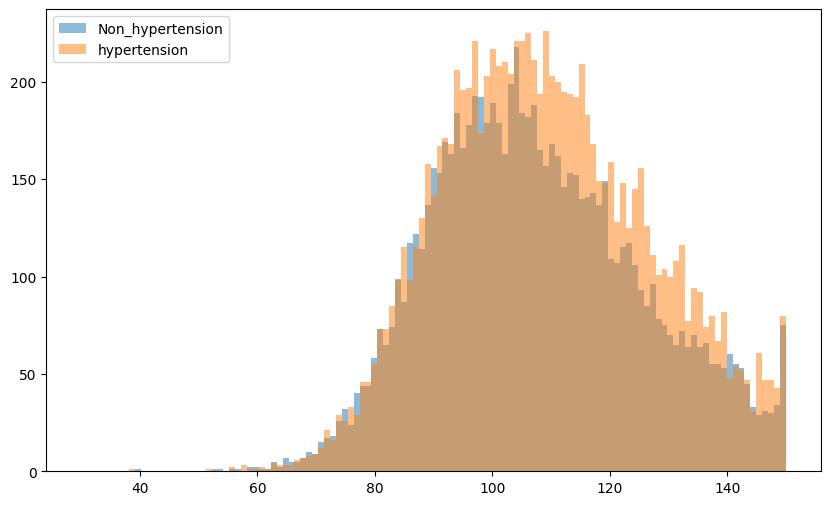

In [ ]:
compare = pd.concat([df,df_1_hyper])

plt.figure(figsize = (10,6))
bins = np.linspace(30,150,120)

plt.hist(compare[compare['type'] == 'Non_hypertension']['value'],bins,alpha = 0.5,label = 'Non_hypertension')
plt.hist(compare[compare['type'] == 'hypertension']['value'],bins,alpha = 0.5,label = 'hypertension')
plt.legend(loc = 'upper left')

plt.show()

In [ ]:
from google.colab import files
compare.to_csv('compare.csv', index=False)
files.download('compare.csv')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
df_1_hyper

,SUBJECT_ID,value,type
0,23,225.0,hypertension
1,36,113.0,hypertension
2,124,82.0,hypertension
3,154,83.0,hypertension
4,188,112.0,hypertension
...,...,...,...
10995,99965,102.0,hypertension
10996,99966,93.0,hypertension
10997,99983,100.0,hypertension
10998,99992,94.0,hypertension


### EDA

In [ ]:
df_1.describe()

,SUBJECT_ID,LOS,AGE,Death,value,BUN,Creatinine,Hemoglobin,Platelet Count
count,11000.0,11000.000000,11000.0,11000.000000,11000.000000,10991.000000,10992.000000,10983.000000,10970.000000
mean,60480.619636,3.616583,68.789,0.093273,117.582818,23.893883,1.195539,10.570359,223.688373
std,25495.307772,4.964475,14.92285,0.290827,31.673361,14.842524,1.407791,1.575476,104.512728
min,23.0,0.003300,18.0,0.000000,39.000000,2.000000,0.150000,4.300000,11.000000
25%,44295.5,1.176275,59.0,0.000000,97.000000,14.000000,0.734722,9.419375,154.666667
50%,62948.0,2.033000,69.0,0.000000,111.000000,19.666667,0.950000,10.300000,208.611111
75%,81491.0,3.857800,80.0,0.000000,128.000000,29.470769,1.275000,11.500000,273.916667
max,99999.0,101.739000,99.0,1.000000,249.000000,208.375000,74.750000,18.244444,1310.000000


In [ ]:
df_1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 11000 entries, 0 to 10999
Data columns (total 16 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   SUBJECT_ID      11000 non-null  Int64  
 1   GENDER          11000 non-null  object 
 2   ADMISSION_TYPE  11000 non-null  object 
 3   INSURANCE       11000 non-null  object 
 4   RELIGION        11000 non-null  object 
 5   MARITAL_STATUS  11000 non-null  object 
 6   ETHNICITY       11000 non-null  object 
 7   LOS             11000 non-null  float64
 8   AGE             11000 non-null  Int64  
 9   diagnosis_name  11000 non-null  object 
 10  Death           11000 non-null  float64
 11  value           11000 non-null  float64
 12  BUN             10991 non-null  float64
 13  Creatinine      10992 non-null  float64
 14  Hemoglobin      10983 non-null  float64
 15  Platelet Count  10970 non-null  float64
dtypes: Int64(2), float64(7), object(7)
memory usage: 1.4+ MB


In [ ]:
len(df_1)

11000

In [ ]:
df_1.isnull().sum()

SUBJECT_ID         0
GENDER             0
ADMISSION_TYPE     0
INSURANCE          0
RELIGION           0
MARITAL_STATUS     0
ETHNICITY          0
LOS                0
AGE                0
diagnosis_name     0
Death              0
value              0
BUN                9
Creatinine         8
Hemoglobin        17
Platelet Count    30
dtype: int64

In [ ]:
df_1 = df_1.dropna()

In [ ]:
df_1['SUBJECT_ID'].nunique()

7895

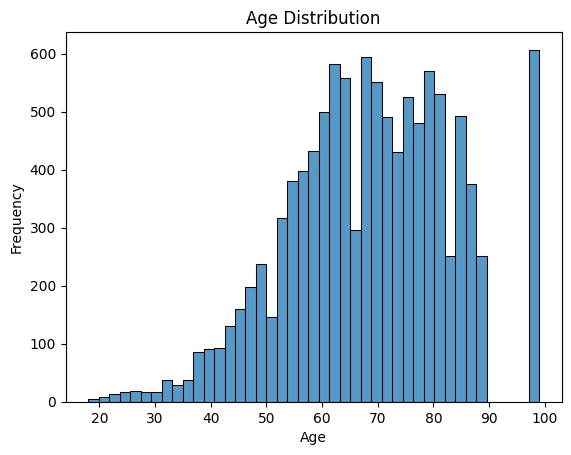

In [ ]:
sns.histplot(df_1['AGE'])
plt.title('Age Distribution')
plt.xlabel('Age')
plt.ylabel('Frequency')
plt.show()

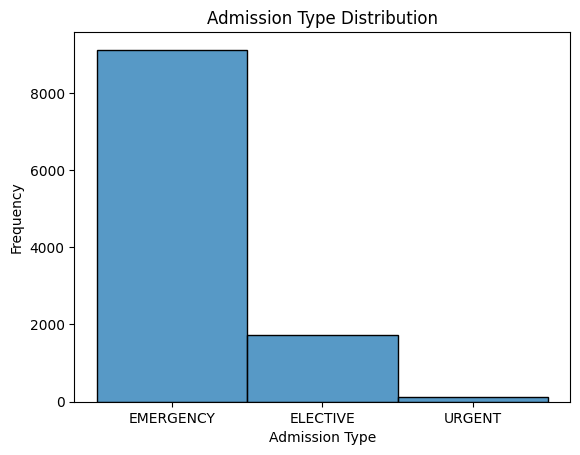

In [ ]:
sns.histplot(df_1['ADMISSION_TYPE'])
plt.title('Admission Type Distribution')
plt.xlabel('Admission Type')
plt.ylabel('Frequency')
plt.show()

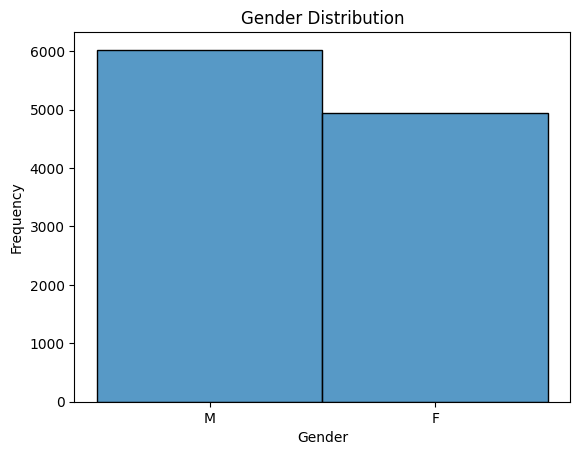

In [ ]:
sns.histplot(df_1['GENDER'])
plt.title('Gender Distribution')
plt.xlabel('Gender')
plt.ylabel('Frequency')
plt.show()

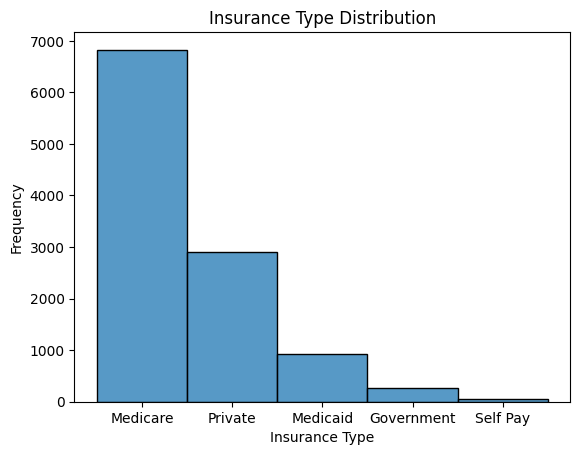

In [ ]:
sns.histplot(df_1['INSURANCE'])
plt.title('Insurance Type Distribution')
plt.xlabel('Insurance Type')
plt.ylabel('Frequency')
plt.show()

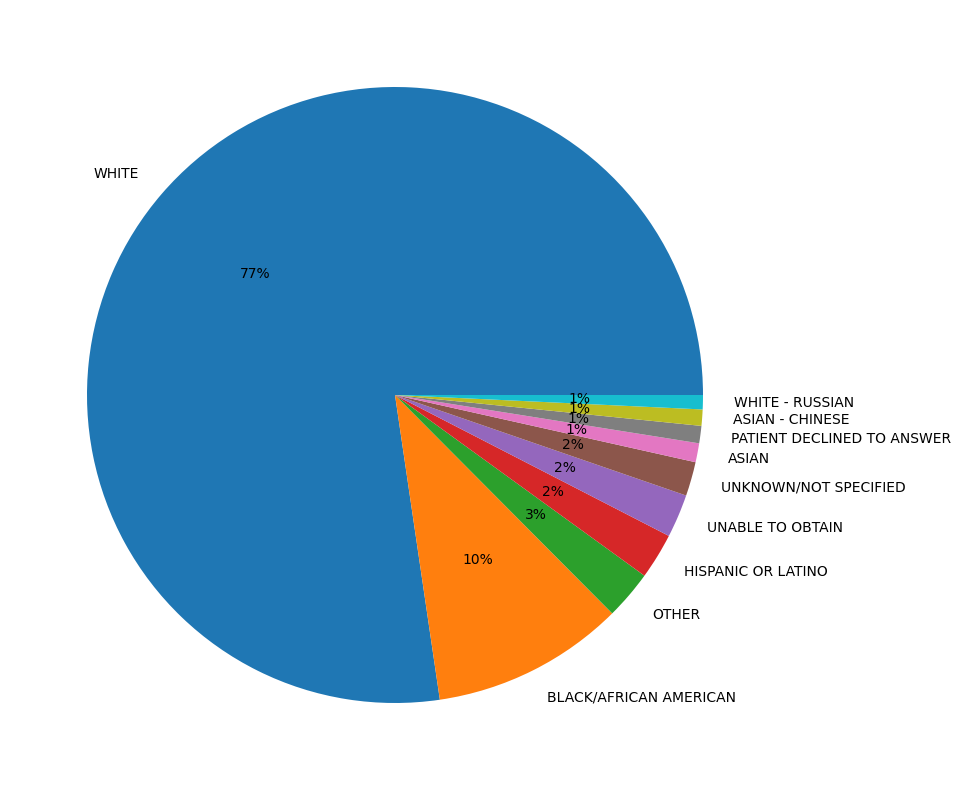

In [ ]:
fig= plt.subplots(figsize=(20,10))
ethnicity_counts = df_1['ETHNICITY'].value_counts()
ethnicity_table = ethnicity_counts.reset_index()
ethnicity_table.columns = ['Ethnicity', 'Count']  # Rename columns appropriately

plt.pie(ethnicity_table['Count'][0:10], labels=ethnicity_table['Ethnicity'][0:10],autopct='%.0f%%')
plt.show()

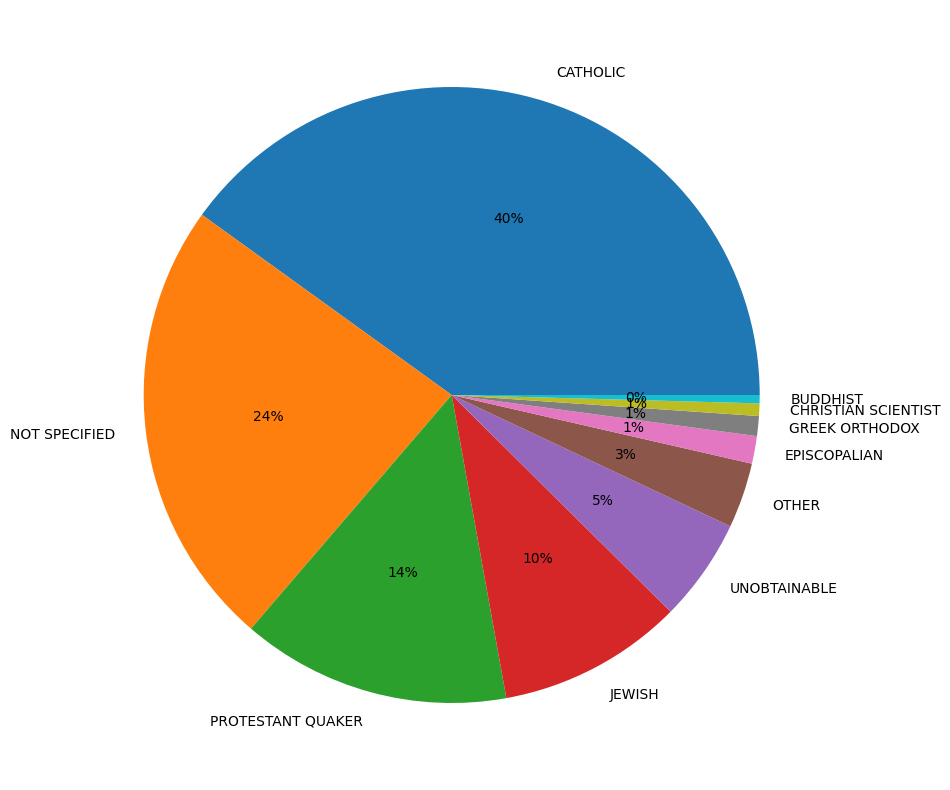

In [ ]:
fig= plt.subplots(figsize=(20,10))
ethnicity_counts = df_1['RELIGION'].value_counts()
ethnicity_table = ethnicity_counts.reset_index()
ethnicity_table.columns = ['RELIGION', 'Count']  # Rename columns appropriately

plt.pie(ethnicity_table['Count'][0:10], labels=ethnicity_table['RELIGION'][0:10],autopct='%.0f%%')
plt.show()

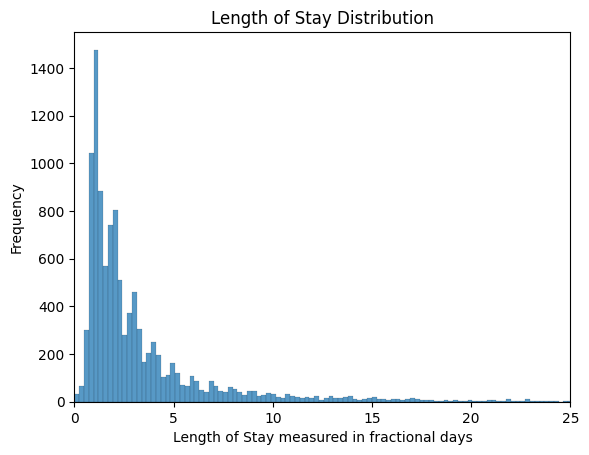

In [ ]:
sns.histplot(df_1['LOS'])
plt.title('Length of Stay Distribution')
plt.xlabel('Length of Stay measured in fractional days')
plt.ylabel('Frequency')
plt.xlim(0,25)
plt.show()

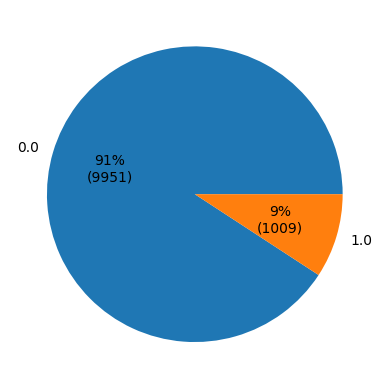

In [ ]:
d_counts = df_1['Death'].value_counts()
d_table = d_counts.reset_index()
d_table.columns = ['Death', 'Count']  # Rename columns appropriately

counts = d_table['Count']
labels = d_table['Death']

def make_autopct(counts):
    def my_autopct(pct):
        total = sum(counts)
        val = int(round(pct*total/100.0))
        return '{p:.0f}%\n({v:d})'.format(p=pct, v=val)
    return my_autopct

plt.pie(counts, labels=labels, autopct=make_autopct(counts))
plt.show()

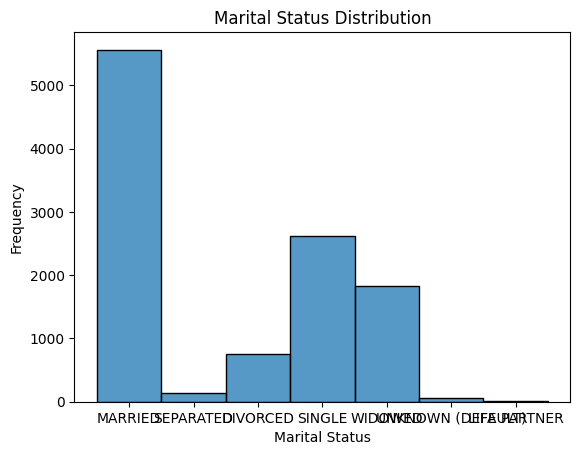

In [ ]:
sns.histplot(df_1['MARITAL_STATUS'])
plt.title('Marital Status Distribution')
plt.xlabel('Marital Status')
plt.ylabel('Frequency')
plt.show()

In [ ]:
df = df_1.copy()
df = df.drop(columns = 'MARITAL_STATUS')
df = df.dropna(subset = list(df.columns.values))
df = df[df.AGE > 0]
df = df.reset_index(drop = True)
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10960 entries, 0 to 10959
Data columns (total 15 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   SUBJECT_ID      10960 non-null  Int64  
 1   GENDER          10960 non-null  object 
 2   ADMISSION_TYPE  10960 non-null  object 
 3   INSURANCE       10960 non-null  object 
 4   RELIGION        10960 non-null  object 
 5   ETHNICITY       10960 non-null  object 
 6   LOS             10960 non-null  float64
 7   AGE             10960 non-null  Int64  
 8   diagnosis_name  10960 non-null  object 
 9   Death           10960 non-null  float64
 10  value           10960 non-null  float64
 11  BUN             10960 non-null  float64
 12  Creatinine      10960 non-null  float64
 13  Hemoglobin      10960 non-null  float64
 14  Platelet Count  10960 non-null  float64
dtypes: Int64(2), float64(7), object(6)
memory usage: 1.3+ MB


In [ ]:
gender =pd.get_dummies(df.GENDER)
df = pd.concat([df,gender],axis = 1)
admission = pd.get_dummies(df.ADMISSION_TYPE)
df = pd.concat([df,admission],axis = 1)
insurance = pd.get_dummies(df.INSURANCE)
df = pd.concat([df,insurance],axis = 1)
region = pd.get_dummies(df.RELIGION)
df = pd.concat([df,region],axis = 1)
ethnicity = pd.get_dummies(df.ETHNICITY)
df = pd.concat([df,ethnicity],axis = 1)
df = df.drop(columns = ['SUBJECT_ID','GENDER','ADMISSION_TYPE','INSURANCE','Death','M'])
df = df.drop(columns = ['RELIGION','ETHNICITY','diagnosis_name'])
df_los = df


In [ ]:
df_1

,SUBJECT_ID,GENDER,ADMISSION_TYPE,INSURANCE,RELIGION,MARITAL_STATUS,ETHNICITY,LOS,AGE,diagnosis_name,Death,value,BUN,Creatinine,Hemoglobin,Platelet Count
0,23,M,EMERGENCY,Medicare,CATHOLIC,MARRIED,WHITE,1.1862,75,Hypertension NOS,0.0,225.0,14.250000,0.675000,11.275000,193.500000
1,36,M,ELECTIVE,Medicare,NOT SPECIFIED,MARRIED,WHITE,4.3483,73,Hypertension NOS,0.0,113.0,19.166667,1.061111,10.953535,187.800000
2,124,M,EMERGENCY,Medicare,CATHOLIC,MARRIED,WHITE,22.9075,75,Hypertension NOS,1.0,82.0,54.531746,2.191667,10.494583,168.258621
3,154,M,EMERGENCY,Medicare,EPISCOPALIAN,SEPARATED,WHITE,2.0859,54,Hypertension NOS,0.0,83.0,12.500000,1.000000,10.116667,171.000000
4,188,M,EMERGENCY,Private,CATHOLIC,MARRIED,WHITE,0.9391,55,Hypertension NOS,0.0,112.0,28.270833,2.146125,9.986764,86.837912
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10995,99965,M,EMERGENCY,Medicare,PROTESTANT QUAKER,MARRIED,WHITE,1.7262,66,Hypertension NOS,0.0,102.0,13.000000,0.900000,9.100000,226.000000
10996,99966,M,EMERGENCY,Medicare,NOT SPECIFIED,MARRIED,WHITE,1.7034,77,Hypertension NOS,0.0,93.0,22.000000,1.350000,12.300000,141.500000
10997,99983,M,EMERGENCY,Medicare,PROTESTANT QUAKER,MARRIED,UNKNOWN/NOT SPECIFIED,1.0399,79,Hypertension NOS,0.0,100.0,15.500000,1.150000,12.750000,222.333333
10998,99992,F,EMERGENCY,Medicare,CATHOLIC,WIDOWED,WHITE,1.9745,66,Hypertension NOS,0.0,94.0,50.000000,1.000000,10.300000,112.333333


In [ ]:
y = df_los.LOS
X = df_los.drop(columns = ['LOS'])

X_train,X_test,y_train,y_test = train_test_split(X,y,train_size = 0.7)
X_train.head()

,AGE,value,BUN,Creatinine,Hemoglobin,Platelet Count,F,ELECTIVE,EMERGENCY,URGENT,...,PATIENT DECLINED TO ANSWER,PORTUGUESE,SOUTH AMERICAN,UNABLE TO OBTAIN,UNKNOWN/NOT SPECIFIED,WHITE,WHITE - BRAZILIAN,WHITE - EASTERN EUROPEAN,WHITE - OTHER EUROPEAN,WHITE - RUSSIAN
6722,69,106.0,22.000000,0.500000,7.450000,136.000000,True,False,True,False,...,False,False,False,False,False,True,False,False,False,False
7728,70,119.0,43.953700,1.826524,8.738964,307.969673,False,False,True,False,...,False,False,False,False,False,True,False,False,False,False
4800,82,192.0,27.666667,0.733333,10.800000,280.000000,False,False,True,False,...,False,False,False,False,False,True,False,False,False,False
3039,38,146.0,30.700000,2.752174,8.304762,331.702703,False,False,True,False,...,False,False,False,False,True,False,False,False,False,False
2824,78,101.0,14.000000,0.800000,9.300000,183.000000,True,False,True,False,...,False,False,False,False,False,True,False,False,False,False


In [ ]:
rf = RandomForestRegressor(min_samples_leaf = 10,max_features = 10)
rf.fit(X_train,y_train)

RandomForestRegressor(max_features=10, min_samples_leaf=10)

In [ ]:
impo = pd.DataFrame({'features':X_train.columns.values,'importance':rf.feature_importances_})
impo.sort_values(by = 'importance',ascending = False,inplace = True)

print(impo.head())

         features  importance
1           value    0.427975
2             BUN    0.147997
4      Hemoglobin    0.106515
3      Creatinine    0.101221
5  Platelet Count    0.079042


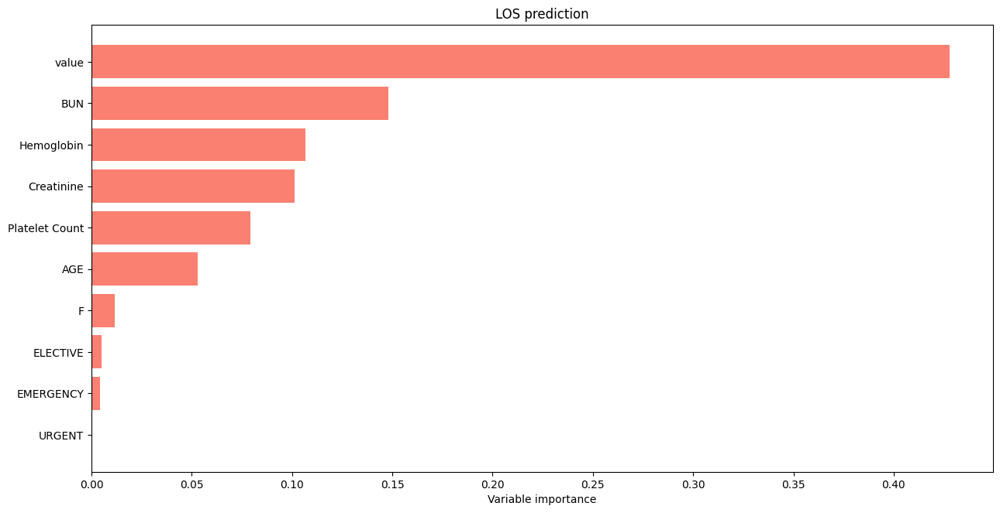

In [ ]:
fig, ax = plt.subplots(figsize=(15,7.5))
k = 10
inds = np.argsort(rf.feature_importances_[0:k])
#inds = np.flip(inds)
ax.barh(np.arange(k),rf.feature_importances_[inds], color='salmon')
ax.set_yticks(np.arange(k))

A = np.array(X_train.columns.values)
B = np.array(inds)
sorted_a = A[B]

_ = ax.set_yticklabels(sorted_a)
_ = ax.set_xlabel('Variable importance')
_ = ax.set_title('LOS prediction')

# 2. For those diagnosed 'Atrial fibrillation', investigate variables correlated with mortality and LOS


In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn import preprocessing
from sklearn import utils
from sklearn.tree import export_graphviz
from sklearn import tree
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

In [ ]:
#query MIMIC III full dataset to join patients, admissions, and diagnoses tables
#if deathtime is not null, indicating the patient was dead, recode as 1, else 0
#patients over the age of 89 are given a non-specific age greater than 299 years old, we will record those with value of 99
sql_query = ('''
SELECT
p.SUBJECT_ID, p.GENDER, avg(icu.LOS) as LOS ,adm.Diagnosis, round(avg(labevents.valuenum),2) as Total,labitem.label,
avg(CASE
        WHEN adm.DEATHTIME IS NOT NULL THEN 1
        ELSE 0
    END) AS Death,
dd.short_title AS diagnosis_name,
avg(CASE
        WHEN date_diff(adm.ADMITTIME, p.DOB, year)> 89 THEN 99
        ELSE date_diff(adm.ADMITTIME, p.DOB, year)
    END) AS AGE
FROM
    `physionet-data.mimiciii_clinical.patients` p
JOIN
    `physionet-data.mimiciii_clinical.admissions` adm ON p.subject_id = adm.subject_id
JOIN
    `physionet-data.mimiciii_clinical.diagnoses_icd`  di ON p.subject_id = di.subject_id
JOIN
    `physionet-data.mimiciii_clinical.d_icd_diagnoses` dd ON di.icd9_code = dd.icd9_code
JOIN
    `physionet-data.mimiciii_clinical.icustays` icu ON adm.hadm_id = icu.hadm_id
JOIN
    `physionet-data.mimiciii_clinical.labevents` labevents ON adm.hadm_id = labevents.hadm_id
JOIN
    `physionet-data.mimiciii_clinical.d_labitems` labitem ON labitem.itemid = labevents.itemid
WHERE
    dd.short_title = "Hypertension NOS" and labitem.label in ('Glucose','Hematocrit','Potassium','Sodium','Hemoglobin','Chloride','Creatinine','Urea Nitrogen',
    'Bicarbonate','Anion Gap')
group by p.subject_id,p.gender,adm.diagnosis,diagnosis_name,labitem.label
''')

df_2 = client.query(sql_query).to_dataframe()
df_2.head(10)

,SUBJECT_ID,GENDER,LOS,Diagnosis,Total,label,Death,diagnosis_name,AGE
0,12634,F,5.6368,"A-FIB,R/O MI",13.95,Anion Gap,0.0,Hypertension NOS,64.0
1,24376,M,1.8408,MYOCARDIAL INFARCTION,13.67,Anion Gap,0.0,Hypertension NOS,45.0
2,72627,M,10.9672,INTRAPARENCHYMAL HEMORRHAGE,12.21,Anion Gap,0.0,Hypertension NOS,78.0
3,11691,F,3.4598,PANCREATITIS,13.00,Anion Gap,0.0,Hypertension NOS,22.0
4,28765,F,4.1837,CONGESTIVE HEART FAILURE,12.36,Anion Gap,0.0,Hypertension NOS,76.0
5,41290,F,3.0880,PNEUMOPERITONEUM,11.90,Anion Gap,0.0,Hypertension NOS,43.0
6,69620,M,7.7854,STROKE/TIA,12.95,Anion Gap,1.0,Hypertension NOS,63.0
7,69000,M,24.0078,CONJESTIVE HEART FAILURE,12.54,Anion Gap,1.0,Hypertension NOS,86.0
8,6667,M,23.9667,AORTIC ANEURYSM,13.97,Anion Gap,0.0,Hypertension NOS,56.0
9,97818,F,0.9049,CHEST PAIN,13.00,Anion Gap,0.0,Hypertension NOS,62.0


In [ ]:
df_2.describe()

,SUBJECT_ID,LOS,Total,Death,AGE
count,231779.0,231779.000000,231771.000000,231779.000000,231779.000000
mean,36656.265926,3.897763,49.219337,0.098728,68.940603
std,28956.427665,5.685783,54.948235,0.297853,14.999891
min,9.0,0.000300,0.100000,0.000000,0.000000
25%,13440.0,1.230600,10.080000,0.000000,59.000000
50%,26549.0,2.159700,24.330000,0.000000,69.000000
75%,59786.5,4.055200,103.000000,0.000000,80.000000
max,99999.0,135.566700,773.330000,1.000000,99.000000


### Data Preprocessing

### EDA

In [ ]:
df_2 = df_2.dropna()
pivot = df_2.pivot_table(index = 'SUBJECT_ID',columns = 'label',values = 'Total',aggfunc = 'mean')

#df_2 = df_2.drop(columns = ['Total','label'])

df_2 = pd.merge(pivot,df_2,how = 'left',on = 'SUBJECT_ID')

df_2 = df_2.drop_duplicates(subset=['SUBJECT_ID'])

df_2 = df_2.reset_index(drop = True)

df_2.Death.astype('int')

df_2['live_die'] = df_2.Death.apply(lambda x: 'live' if x  > 0 else 'die')


In [ ]:
df_2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 17546 entries, 0 to 17545
Data columns (total 20 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   SUBJECT_ID      17546 non-null  Int64  
 1   Anion Gap       17477 non-null  float64
 2   Bicarbonate     17480 non-null  float64
 3   Chloride        17479 non-null  float64
 4   Creatinine      17524 non-null  float64
 5   Glucose         17526 non-null  float64
 6   Hematocrit      17526 non-null  float64
 7   Hemoglobin      17529 non-null  float64
 8   Potassium       17485 non-null  float64
 9   Sodium          17480 non-null  float64
 10  Urea Nitrogen   17524 non-null  float64
 11  GENDER          17546 non-null  object 
 12  LOS             17546 non-null  float64
 13  Diagnosis       17546 non-null  object 
 14  Total           17546 non-null  float64
 15  label           17546 non-null  object 
 16  Death           17546 non-null  float64
 17  diagnosis_name  17546 non-null 

In [ ]:
len(df_2)

17546

In [ ]:
df_2.isnull().sum()

SUBJECT_ID         0
Anion Gap         69
Bicarbonate       66
Chloride          67
Creatinine        22
Glucose           20
Hematocrit        20
Hemoglobin        17
Potassium         61
Sodium            66
Urea Nitrogen     22
GENDER             0
LOS                0
Diagnosis          0
Total              0
label              0
Death              0
diagnosis_name     0
AGE                0
live_die           0
dtype: int64

In [ ]:
df_2['SUBJECT_ID'].nunique()

17546

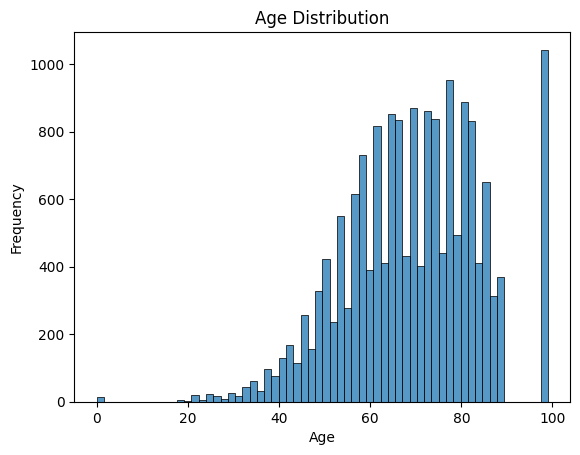

In [ ]:
sns.histplot(df_2['AGE'])
plt.title('Age Distribution')
plt.xlabel('Age')
plt.ylabel('Frequency')
plt.show()

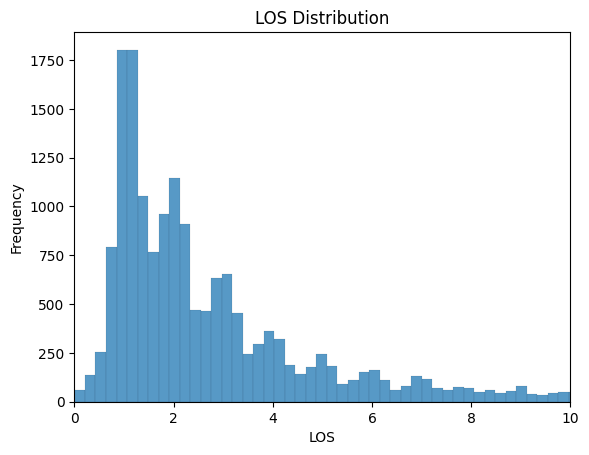

In [ ]:
sns.histplot(df_2['LOS'])
plt.title('LOS Distribution')
plt.xlabel('LOS')
plt.ylabel('Frequency')
plt.xlim(0,10)
plt.show()

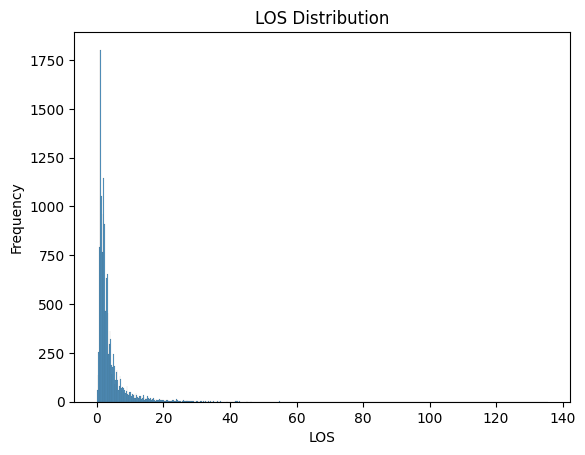

In [ ]:
sns.histplot(df_2['LOS'])
plt.title('LOS Distribution')
plt.xlabel('LOS')
plt.ylabel('Frequency')
#plt.xlim(0,10)
plt.show()

In [ ]:
# print(sum(df.Death) / df.shape[0])

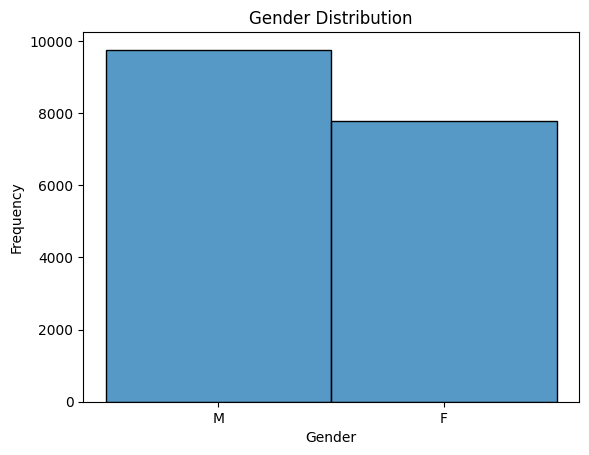

In [ ]:
sns.histplot(df_2['GENDER'])
plt.title('Gender Distribution')
plt.xlabel('Gender')
plt.ylabel('Frequency')
plt.show()

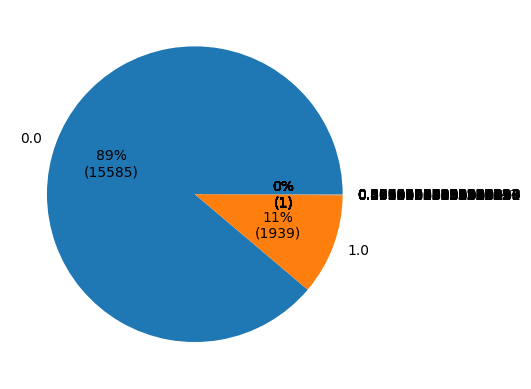

In [ ]:
d_counts = df_2['Death'].value_counts()
d_table = d_counts.reset_index()
d_table.columns = ['Death', 'Count']  # Rename columns appropriately

counts = d_table['Count']
labels = d_table['Death']

def make_autopct(counts):
    def my_autopct(pct):
        total = sum(counts)
        val = int(round(pct*total/100.0))
        return '{p:.0f}%\n({v:d})'.format(p=pct, v=val)
    return my_autopct

plt.pie(counts, labels=labels, autopct=make_autopct(counts))
plt.show()

<ipython-input-56-ececab12e798>:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.Diagnosis[i] = re.sub(r'[^a-z]', ' ', df.Diagnosis[i].lower())


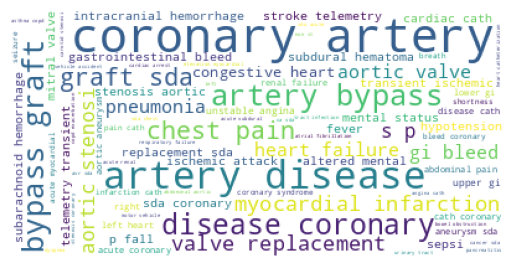

In [ ]:
from wordcloud import WordCloud,ImageColorGenerator
import re

df = df_2.copy()
df = df.dropna()
df = df.reset_index(drop = True)

for i in range(df.shape[0]):
  df.Diagnosis[i] = re.sub(r'[^a-z]', ' ', df.Diagnosis[i].lower())

long_string = ','.join([txt for txt in list(df.Diagnosis)])
word_cloud = WordCloud(background_color= 'white', max_words = 100)
word_cloud.generate(long_string)

plt.imshow(word_cloud)
plt.axis('off')
plt.show()

In [ ]:
'''import warnings

warnings.filterwarnings('ignore')

df['coronary'] = 0
df['congestive'] = 0
for i in range(df.shape[0]):
  if 'coronary' in df.Diagnosis[i]:
    df.coronary[i] = 1
  else:
    df.coronary[i] = 0
  if 'congestive' in df.Diagnosis[i]:
    df.congestive[i] = 1
  else:
    df.congestive[i] = 0

print(sum(df.coronary)/df.shape[0])
print(sum(df.congestive)/df.shape[0])'''

"import warnings\n\nwarnings.filterwarnings('ignore')\n\ndf['coronary'] = 0\ndf['congestive'] = 0\nfor i in range(df.shape[0]):\n  if 'coronary' in df.Diagnosis[i]:\n    df.coronary[i] = 1\n  else:\n    df.coronary[i] = 0\n  if 'congestive' in df.Diagnosis[i]:\n    df.congestive[i] = 1\n  else:\n    df.congestive[i] = 0\n\nprint(sum(df.coronary)/df.shape[0])\nprint(sum(df.congestive)/df.shape[0])"

In [ ]:
gender =pd.get_dummies(df.GENDER)
df = pd.concat([df,gender],axis = 1)

df_short = df[df.LOS < 15]
df_long = df[df.LOS > 15]

### model

In [ ]:
df = df_1.copy()
df = df.drop(columns = 'MARITAL_STATUS')
df = df.dropna(subset = list(df.columns.values))
df = df[df.AGE > 0]
df = df.reset_index(drop = True)

gender =pd.get_dummies(df.GENDER)
df = pd.concat([df,gender],axis = 1)
admission = pd.get_dummies(df.ADMISSION_TYPE)
df = pd.concat([df,admission],axis = 1)
insurance = pd.get_dummies(df.INSURANCE)
df = pd.concat([df,insurance],axis = 1)
region = pd.get_dummies(df.RELIGION)
df = pd.concat([df,region],axis = 1)
ethnicity = pd.get_dummies(df.ETHNICITY)
df = pd.concat([df,ethnicity],axis = 1)
df = df.drop(columns = ['SUBJECT_ID','GENDER','ADMISSION_TYPE','INSURANCE','LOS','M'])
df = df.drop(columns = ['RELIGION','ETHNICITY','diagnosis_name'])
df_death = df



The accuracy is 0.8276071754332623


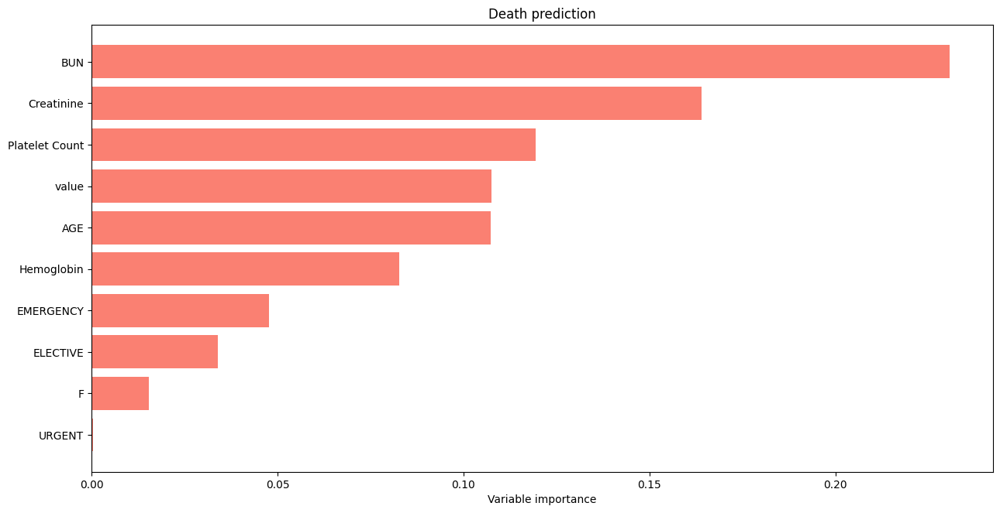

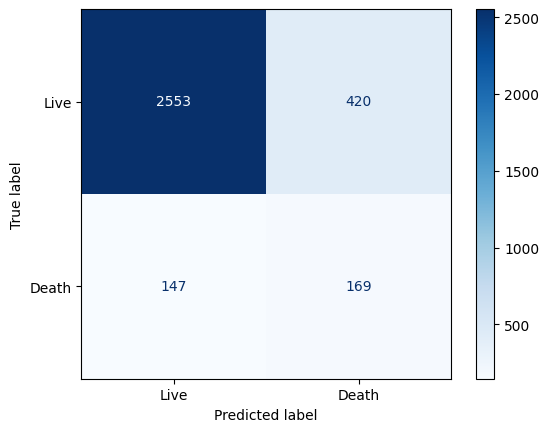

In [ ]:
y = df_death.Death
X = df_death.drop(columns = ['Death'])

X_train,X_test,y_train,y_test = train_test_split(X,y,train_size = 0.7)

class_weights = {0: 1, 1: 10}

rf = RandomForestClassifier(min_samples_leaf = 10,max_features = 10,class_weight=class_weights)
rf.fit(X_train,y_train)

impo = pd.DataFrame({'features':X_train.columns.values,'importance':rf.feature_importances_})
impo.sort_values(by = 'importance',ascending = False,inplace = True)

fig, ax = plt.subplots(figsize=(15,7.5))
k = 10
inds = np.argsort(rf.feature_importances_[0:k])
#inds = np.flip(inds)
ax.barh(np.arange(k),rf.feature_importances_[inds], color='salmon')
ax.set_yticks(np.arange(k))

A = np.array(X_train.columns.values)
B = np.array(inds)
sorted_a = A[B]

_ = ax.set_yticklabels(sorted_a)
_ = ax.set_xlabel('Variable importance')
_ = ax.set_title('Death prediction')

classes = ['Live','Death']
y_pred  = rf.predict(X_test)
confusion_matrix(y_test, y_pred)

disp = ConfusionMatrixDisplay.from_estimator(rf, X_test ,y_test, display_labels=classes,cmap=plt.cm.Blues)
#disp.plot()

accuracy = sum(y_pred == y_test)/ len(y_pred)

print('\n')
print('The accuracy is {}'.format(accuracy))


# 3. Predictive Model


## Mortality

Based on the importance factors we selected from previous steps, now we want to build predictive model in predicting mortality using only these variables.

Model Selection: We will consider the following models:

Logistic Regression

*   Support Vector Machine (SVM)
*   K-Nearest Neighbors (KNN)
*   Decision Tree Classifier
*   Gradient Boosting Classifier
*   Naive Bayes Classifier
*   Neural Network (using a simple Multi-Layer Perceptron)

Training and Validation: Each model will be trained on the same training dataset and validated on the test dataset.

Performance Metrics: We will use accuracy, precision, recall, and the area under the ROC curve (AUC-ROC) to evaluate each model.

Comparison and Selection: Compare the performance of all models and select the best one based on the metrics.

In [ ]:
from sklearn import preprocessing
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, accuracy_score
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import plot_tree
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.neural_network import MLPClassifier
from sklearn.metrics import precision_score, recall_score, roc_auc_score



def compare_models_final(df):
    X = df[['BUN','Creatinine','AGE','value','Platelet Count','Hemoglobin']]
    y = df['Death']

    lab = preprocessing.LabelEncoder()
    y = lab.fit_transform(y)

    X_train, X_test, y_train, y_test = train_test_split(X, y, train_size=0.7)

    class_weights = {0: 1, 1: 10}

    models = {
        "Random Forest": RandomForestClassifier(min_samples_leaf=10, max_features='auto', max_depth=3),
        "Logistic Regression": LogisticRegression(class_weight = class_weights),
        "SVM": SVC(probability=True),
        "KNN": KNeighborsClassifier(),
        "Decision Tree": DecisionTreeClassifier(class_weight = class_weights),
        "Gradient Boosting": GradientBoostingClassifier(),
        "Naive Bayes": GaussianNB(),
        "Neural Network": MLPClassifier(max_iter=1000)
    }

    performance = {}

    for name, model in models.items():
        model.fit(X_train, y_train)
        y_pred = model.predict(X_test)

        accuracy = accuracy_score(y_test, y_pred)
        precision = precision_score(y_test, y_pred, average='weighted')
        recall = recall_score(y_test, y_pred, average='weighted')

        if hasattr(model, "predict_proba"):
            auc = roc_auc_score(y_test, model.predict_proba(X_test)[:, 1], multi_class='ovr')
        else:
            auc = "N/A"

        performance[name] = {'Accuracy': accuracy, 'Precision': precision, 'Recall': recall, 'AUC': auc}

    return performance

performance_final = compare_models_final(df_death)

sorted_performance_final = sorted(performance_final.items(), key=lambda x: x[1]['Accuracy'], reverse=True)

sorted_performance_final



/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


[('Gradient Boosting',
  {'Accuracy': 0.9185162663423533,
   'Precision': 0.896774780315153,
   'Recall': 0.9185162663423533,
   'AUC': 0.7826921015968278}),
 ('Neural Network',
  {'Accuracy': 0.9169960474308301,
   'Precision': 0.9073980185321129,
   'Recall': 0.9169960474308301,
   'AUC': 0.7037592731516212}),
 ('Random Forest',
  {'Accuracy': 0.9157798723016114,
   'Precision': 0.9228772180188166,
   'Recall': 0.9157798723016114,
   'AUC': 0.7769686469236357}),
 ('SVM',
  {'Accuracy': 0.9151717847370021,
   'Precision': 0.8375393955787098,
   'Recall': 0.9151717847370021,
   'AUC': 0.6353112087545696}),
 ('KNN',
  {'Accuracy': 0.911827303131651,
   'Precision': 0.8880770964604284,
   'Recall': 0.911827303131651,
   'AUC': 0.6966741685421356}),
 ('Naive Bayes',
  {'Accuracy': 0.889024019458802,
   'Precision': 0.8761367162591761,
   'Recall': 0.889024019458802,
   'AUC': 0.7516724419200038}),
 ('Decision Tree',
  {'Accuracy': 0.8762541806020067,
   'Precision': 0.8819359468762208,
  

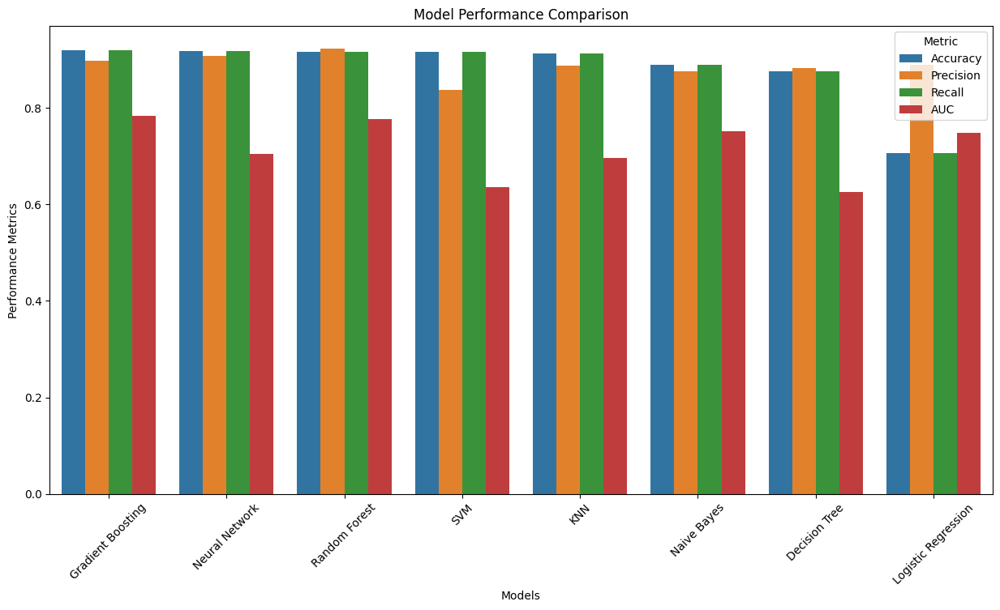

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

model_names = []
accuracies = []
precisions = []
recalls = []
aucs = []

for model, metrics in sorted_performance_final:
    model_names.append(model)
    accuracies.append(metrics['Accuracy'])
    precisions.append(metrics['Precision'])
    recalls.append(metrics['Recall'])
    aucs.append(metrics['AUC'] if metrics['AUC'] != 'N/A' else None)

performance_df = pd.DataFrame({
    'Model': model_names,
    'Accuracy': accuracies,
    'Precision': precisions,
    'Recall': recalls,
    'AUC': aucs
})

# Reshape data into long format
long_df = performance_df.melt(id_vars=['Model'],
                              value_vars=['Accuracy', 'Precision', 'Recall', 'AUC'],
                              var_name='Metric', value_name='Value')

# Create grouped barplot
plt.figure(figsize=(15, 7.5))
sns.barplot(x='Model', y='Value', hue='Metric', data=long_df)
plt.title("Model Performance Comparison")
plt.xlabel("Models")
plt.ylabel("Performance Metrics")
plt.legend(title='Metric')
plt.xticks(rotation=45)  # Rotate model names for better readability
plt.show()

Neural Network and Gradient Boosting are the top performers in terms of Accuracy and Recall.
Gradient Boosting has the highest AUC, which is crucial for a balanced perspective between False Positives and False Negatives.
Neural Network leads slightly in Precision, but not by a significant margin.
Considering all these metrics, Gradient Boosting seems to be the best model due to its high AUC, which indicates its superior ability to differentiate between classes, along with competitive accuracy, precision, and recall. While the Neural Network has marginally better precision and identical recall, the higher AUC of Gradient Boosting makes it a more balanced choice, especially in contexts where the cost of false positives and false negatives is significant.

In [ ]:
X = df_death[['BUN','Creatinine','AGE','value','Platelet Count','Hemoglobin']]
y = df_death['Death']

lab = preprocessing.LabelEncoder()
y = lab.fit_transform(y)

X_train, X_test, y_train, y_test = train_test_split(X, y, train_size=0.7)

models = {
        "Gradient Boosting": GradientBoostingClassifier(),
    }


for name, gradient_boosting_model in models.items():
    gradient_boosting_model.fit(X_train, y_train)

Finally, we create a function that prompts the user to input their data (X) and uses a trained Gradient Boosting model to predict the outcome (y)

In [ ]:
def predict_with_gradient_boosting(model):
    """
    Prompt the user to input their data and predict the outcome using the trained Gradient Boosting model.

    :param model: Trained Gradient Boosting model.
    :return: Predicted outcome.
    """
    try:
        BUN = float(input("Enter BUN level: "))
        Creatinine = float(input("Enter Creatinine level: "))
        AGE = float(input("Enter AGE: "))
        value = float(input("Enter max blood pressure: "))
        Platelet_Count = float(input("Enter Platelet Count level: "))
        Hemoglobin = float(input("Enter Hemoglobin level: "))

        X_new = pd.DataFrame([[BUN,Creatinine,AGE,value,Platelet_Count,Hemoglobin]],
                             columns= ['BUN','Creatinine','AGE','value','Platelet Count','Hemoglobin'])
        y_pred = model.predict(X_new)

        outcome = 'Death' if y_pred[0] == 1 else 'Live'

        return f"The predicted outcome is: {outcome}"

    except ValueError:
        return "Invalid input. Please enter valid numerical values."


result = predict_with_gradient_boosting(gradient_boosting_model)
print(result)


Enter BUN level: 0
Enter Creatinine level: 0
Enter AGE: 0
Enter max blood pressure: 0
Enter Platelet Count level: 0
Enter Hemoglobin level: 0
The predicted outcome is: Death


## Length of stay

Model Selection:
* Linear Regression: Basic yet effective for many linear relationships.
* Ridge Regression: Addresses multicollinearity.
* Lasso Regression: Useful for feature selection.
* Support Vector Regression (SVR): Good for non-linear relationships.
* Gradient Boosting Regressor: An ensemble method that can capture complex patterns.
* K-Nearest Neighbors Regressor: Useful for cases where the prediction is an average of similar instances.




In [ ]:
from sklearn.linear_model import LinearRegression, Ridge, Lasso
from sklearn.svm import SVR
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

def compare_regressors(df):
    X = df[['value','BUN','Hemoglobin','Creatinine','Platelet Count','AGE']]
    y = df['LOS']

    X_train, X_test, y_train, y_test = train_test_split(X, y, train_size=0.7)

    models = {
        "Linear Regression": LinearRegression(),
        "Ridge": Ridge(),
        "Lasso": Lasso(),
        "SVR": SVR(),
        "Random Forest Regressor": RandomForestRegressor(min_samples_leaf=10, max_features=10, max_depth=3),
        "Gradient Boosting Regressor": GradientBoostingRegressor(),
        "KNN Regressor": KNeighborsRegressor()
    }

    performance = {}

    for name, model in models.items():
        model.fit(X_train, y_train)
        y_pred = model.predict(X_test)

        mse = mean_squared_error(y_test, y_pred)
        mae = mean_absolute_error(y_test, y_pred)
        r2 = r2_score(y_test, y_pred)

        performance[name] = {'MSE': mse, 'MAE': mae, 'R2': r2}

    return performance

performance = compare_regressors(df_los)

performance


{'Linear Regression': {'MSE': 23.856997102810855,
  'MAE': 2.467510292775237,
  'R2': 0.2060081968778965},
 'Ridge': {'MSE': 23.856985350209797,
  'MAE': 2.467507155010331,
  'R2': 0.20600858801970134},
 'Lasso': {'MSE': 24.126395756708753,
  'MAE': 2.470827728274998,
  'R2': 0.19704226029982408},
 'SVR': {'MSE': 27.25386681233069,
  'MAE': 2.2584981256456573,
  'R2': 0.09295596763003633},
 'Random Forest Regressor': {'MSE': 24.063308476928782,
  'MAE': 2.453062192065594,
  'R2': 0.19914188678721068},
 'Gradient Boosting Regressor': {'MSE': 22.556981942152593,
  'MAE': 2.3717768808130906,
  'R2': 0.24927438738162544},
 'KNN Regressor': {'MSE': 26.210824036582306,
  'MAE': 2.5972062268166614,
  'R2': 0.12766978390293038}}

<ipython-input-66-e8b610f12dbf>:20: UserWarning: FixedFormatter should only be used together with FixedLocator
  axes[0].set_xticklabels(axes[0].get_xticklabels(),rotation = 90)
<ipython-input-66-e8b610f12dbf>:25: UserWarning: FixedFormatter should only be used together with FixedLocator
  axes[1].set_xticklabels(axes[0].get_xticklabels(),rotation = 90)
<ipython-input-66-e8b610f12dbf>:31: UserWarning: FixedFormatter should only be used together with FixedLocator
  axes[2].set_xticklabels(axes[0].get_xticklabels(),rotation = 90)


[Text(0, 0, 'Linear Regression'),
 Text(1, 0, 'Ridge'),
 Text(2, 0, 'Lasso'),
 Text(3, 0, 'SVR'),
 Text(4, 0, 'Random Forest Regressor'),
 Text(5, 0, 'Gradient Boosting Regressor'),
 Text(6, 0, 'KNN Regressor')]

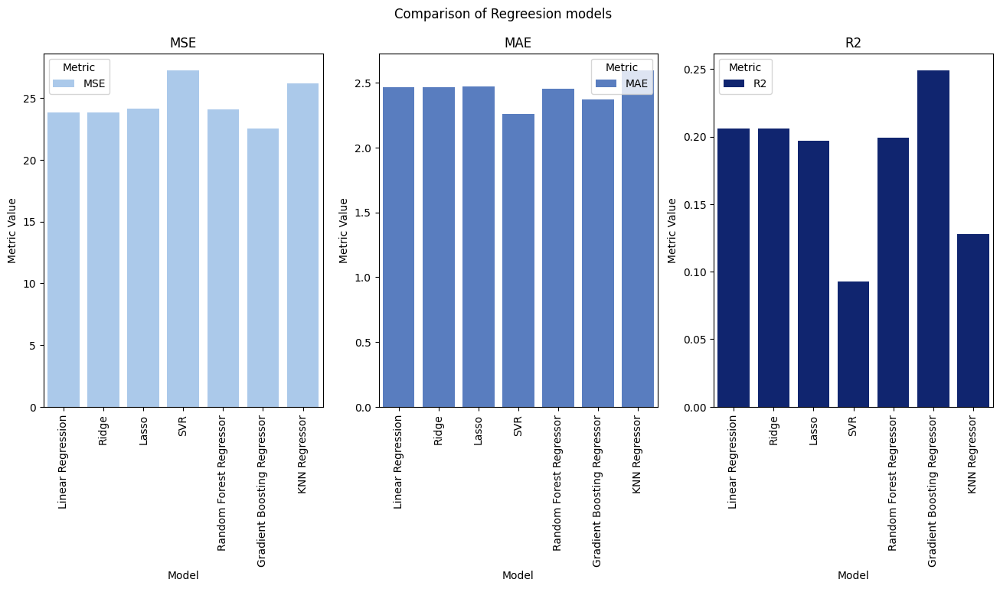

In [ ]:
models = list(performance.keys())
mse = [performance[model]['MSE'] for model in models]
mae = [performance[model]['MAE'] for model in models]
r2 = [performance[model]['R2'] for model in models]

performance_df = pd.DataFrame({
    'Model': models,
    'MSE': mse,
    'MAE': mae,
    'R2': r2
})

performance_melted = performance_df.melt(id_vars="Model", var_name="Metric", value_name="Value")

fig, axes = plt.subplots(1,3,sharex=True, figsize=(16,6))
fig.suptitle('Comparison of Regreesion models')
sns.barplot(ax = axes[0],x='Model', y='Value', hue='Metric',palette="pastel",data=performance_melted[performance_melted.Metric == 'MSE'])
axes[0].set_title("MSE")
axes[0].set_ylabel("Metric Value")
axes[0].set_xticklabels(axes[0].get_xticklabels(),rotation = 90)

sns.barplot(ax = axes[1],x='Model', y='Value', hue='Metric', palette = 'muted',data=performance_melted[performance_melted.Metric == 'MAE'])
axes[1].set_title("MAE")
axes[1].set_ylabel("Metric Value")
axes[1].set_xticklabels(axes[0].get_xticklabels(),rotation = 90)


sns.barplot(ax = axes[2],x='Model', y='Value', hue='Metric', palette = 'dark',data=performance_melted[performance_melted.Metric == 'R2'])
axes[2].set_title("R2")
axes[2].set_ylabel("Metric Value")
axes[2].set_xticklabels(axes[0].get_xticklabels(),rotation = 90)



Gradient Boosting Regressor has the lowest MSE (7.5897) and a reasonably low MAE (2.0403), indicating that it generally makes predictions closer to the actual values with less variance.
Gradient Boosting Regressor also has the highest R2 Score (0.1111), suggesting it explains a higher proportion of the variance in your dependent variable than the other models.
Considering all these metrics, the Gradient Boosting Regressor appears to be the best model among those you tested. It balances well between accuracy (MSE, MAE) and the proportion of explained variance (R2 Score).

In [ ]:
0X = df_los[['BUN','Creatinine','AGE','value','Platelet Count','Hemoglobin']]
y = df_los['LOS']

X_train, X_test, y_train, y_test = train_test_split(X, y, train_size=0.7)

gradient_boosting_regressor = GradientBoostingRegressor()
gradient_boosting_regressor.fit(X_train, y_train)

def predict_with_gradient_boosting_regressor(model):
    """
    Prompt the user to input their data and predict the outcome using the trained Gradient Boosting Regressor.

    :param model: Trained Gradient Boosting Regressor.
    :return: Predicted outcome.
    """
    try:
        BUN = float(input("Enter BUN level: "))
        Creatinine = float(input("Enter Creatinine level: "))
        AGE = float(input("Enter AGE: "))
        value = float(input("Enter max blood pressure: "))
        Platelet_Count = float(input("Enter Platelet Count level: "))
        Hemoglobin = float(input("Enter Hemoglobin level: "))

        X_new = pd.DataFrame([[BUN,Creatinine,AGE,value,Platelet_Count,Hemoglobin]],
                             columns= ['BUN','Creatinine','AGE','value','Platelet Count','Hemoglobin'])

        y_pred = model.predict(X_new)

        return f"The predicted LOS (Length of Stay) is: {y_pred[0]:.2f} days"

    except ValueError:
        return "Invalid input. Please enter valid numerical values."

result = predict_with_gradient_boosting_regressor(gradient_boosting_regressor)
print(result)


Enter BUN level: 0
Enter Creatinine level: 0
Enter AGE: 0
Enter max blood pressure: 0
Enter Platelet Count level: 
Invalid input. Please enter valid numerical values.


### Data Preprocessing

In [ ]:
#query MIMIC III full dataset
sql_query = ('''
SELECT *,
CASE
        WHEN date_diff(adm.ADMITTIME, p.DOB, year)> 89 THEN 99
        ELSE date_diff(adm.ADMITTIME, p.DOB, year)
    END AS AGE,
CASE
        WHEN adm.DEATHTIME IS NOT NULL THEN 1
        ELSE 0
    END AS Death
    FROM `physionet-data.mimiciii_clinical.icustays` icu
    LEFT JOIN `physionet-data.mimiciii_clinical.admissions` adm ON icu.HADM_ID = adm.HADM_ID
    LEFT JOIN `physionet-data.mimiciii_clinical.patients` p ON icu.SUBJECT_ID = p.SUBJECT_ID
    LEFT JOIN `physionet-data.mimiciii_clinical.chartevents` ce ON icu.HADM_ID = ce.HADM_ID
    LEFT JOIN `physionet-data.mimiciii_clinical.d_items`  it ON ce.ITEMID = it.ITEMID
    WHERE icu.LOS >= 0 AND icu.LOS <= 1 AND adm.HAS_CHARTEVENTS_DATA = 1 AND adm.DEATHTIME IS NOT NULL

''')

df_3 = client.query(sql_query).to_dataframe()
df_3.head(10)

,ROW_ID,SUBJECT_ID,HADM_ID,ICUSTAY_ID,DBSOURCE,FIRST_CAREUNIT,LAST_CAREUNIT,FIRST_WARDID,LAST_WARDID,INTIME,...,LABEL,ABBREVIATION,DBSOURCE_1,LINKSTO,CATEGORY,UNITNAME,PARAM_TYPE,CONCEPTID,AGE,Death
0,11904,9352,167713,244800,carevue,MICU,MICU,52,52,2152-04-19 22:10:00,...,Minute Volume(Obser),None,carevue,chartevents,None,None,None,None,99,1
1,11904,9352,167713,244800,carevue,MICU,MICU,52,52,2152-04-19 22:10:00,...,Turn,None,carevue,chartevents,None,None,None,None,99,1
2,11904,9352,167713,244800,carevue,MICU,MICU,52,52,2152-04-19 22:10:00,...,CaO2,None,carevue,chartevents,None,None,None,None,99,1
3,11904,9352,167713,244800,carevue,MICU,MICU,52,52,2152-04-19 22:10:00,...,Previous Weight,None,carevue,chartevents,None,None,None,None,99,1
4,11904,9352,167713,244800,carevue,MICU,MICU,52,52,2152-04-19 22:10:00,...,Service,None,carevue,chartevents,None,None,None,None,99,1
5,11904,9352,167713,244800,carevue,MICU,MICU,52,52,2152-04-19 22:10:00,...,Heart Rate,None,carevue,chartevents,None,None,None,None,99,1
6,11904,9352,167713,244800,carevue,MICU,MICU,52,52,2152-04-19 22:10:00,...,Support Systems,None,carevue,chartevents,None,None,None,None,99,1
7,11904,9352,167713,244800,carevue,MICU,MICU,52,52,2152-04-19 22:10:00,...,RBC,None,carevue,chartevents,Hematology,None,None,None,99,1
8,11904,9352,167713,244800,carevue,MICU,MICU,52,52,2152-04-19 22:10:00,...,LUL Lung Sounds,None,carevue,chartevents,None,None,None,None,99,1
9,11904,9352,167713,244800,carevue,MICU,MICU,52,52,2152-04-19 22:10:00,...,Ramsey SedationScale,None,carevue,chartevents,None,None,None,None,99,1


### EDA

In [ ]:
len(df_3)

2669012

In [ ]:
list(df_3.columns)

['ROW_ID',
 'SUBJECT_ID',
 'HADM_ID',
 'ICUSTAY_ID',
 'DBSOURCE',
 'FIRST_CAREUNIT',
 'LAST_CAREUNIT',
 'FIRST_WARDID',
 'LAST_WARDID',
 'INTIME',
 'OUTTIME',
 'LOS',
 'ROW_ID_1',
 'SUBJECT_ID_1',
 'HADM_ID_1',
 'ADMITTIME',
 'DISCHTIME',
 'DEATHTIME',
 'ADMISSION_TYPE',
 'ADMISSION_LOCATION',
 'DISCHARGE_LOCATION',
 'INSURANCE',
 'LANGUAGE',
 'RELIGION',
 'MARITAL_STATUS',
 'ETHNICITY',
 'EDREGTIME',
 'EDOUTTIME',
 'DIAGNOSIS',
 'HOSPITAL_EXPIRE_FLAG',
 'HAS_CHARTEVENTS_DATA',
 'ROW_ID_2',
 'SUBJECT_ID_2',
 'GENDER',
 'DOB',
 'DOD',
 'DOD_HOSP',
 'DOD_SSN',
 'EXPIRE_FLAG',
 'ROW_ID_3',
 'SUBJECT_ID_3',
 'HADM_ID_2',
 'ICUSTAY_ID_1',
 'ITEMID',
 'CHARTTIME',
 'STORETIME',
 'CGID',
 'VALUE',
 'VALUENUM',
 'VALUEUOM',
 'WARNING',
 'ERROR',
 'RESULTSTATUS',
 'STOPPED',
 'ROW_ID_4',
 'ITEMID_1',
 'LABEL',
 'ABBREVIATION',
 'DBSOURCE_1',
 'LINKSTO',
 'CATEGORY',
 'UNITNAME',
 'PARAM_TYPE',
 'CONCEPTID',
 'AGE',
 'Death']

In [ ]:
df_3.describe()

,ROW_ID,SUBJECT_ID,HADM_ID,ICUSTAY_ID,FIRST_WARDID,LAST_WARDID,INTIME,OUTTIME,LOS,ROW_ID_1,...,CHARTTIME,STORETIME,CGID,VALUENUM,WARNING,ERROR,ROW_ID_4,ITEMID_1,AGE,Death
count,2669012.0,2669012.0,2669012.0,2669012.0,2669012.0,2669012.0,2669012,2669012,2.669012e+06,2669012.0,...,2669009,2661024,2661024.0,1.215678e+06,1076636.0,1076636.0,2669009.0,2669009.0,2669012.0,2669012.0
mean,32565.170537,35040.840954,148345.767668,248066.954219,34.951838,34.944796,2150-03-04 07:54:30.979893,2150-03-04 23:52:36.335121,6.653437e-01,31306.492743,...,2150-03-02 20:00:07.153171,2150-04-21 13:40:57.817314,17893.734066,7.256670e+01,0.034355,0.001533,6171.299298,91547.267338,70.056058,1.0
min,70.0,67.0,100197.0,200024.0,7.0,7.0,2100-09-04 22:09:48,2100-09-05 15:47:29,2.000000e-04,68.0,...,2100-09-04 20:05:00,2100-09-04 22:09:00,14023.0,-5.000000e+02,0.0,0.0,1.0,1.0,0.0,1.0
25%,18947.0,14936.0,122413.0,224569.0,15.0,15.0,2125-04-27 18:36:52,2125-04-28 12:18:43,5.347000e-01,18271.0,...,2125-04-12 08:00:00,2125-04-17 08:03:00,15674.0,5.000000e+00,0.0,0.0,507.0,550.0,60.0,1.0
50%,34261.0,27022.0,145460.0,244434.0,33.0,33.0,2150-12-24 22:54:27,2150-12-25 19:20:41,7.281000e-01,33022.0,...,2150-12-14 16:00:00,2150-12-31 10:38:00,17741.0,3.600000e+01,0.0,0.0,2981.0,5818.0,71.0,1.0
75%,44838.0,50488.0,175448.0,274348.0,52.0,52.0,2175-03-04 15:13:48,2175-03-05 11:54:26,8.516000e-01,43095.0,...,2175-04-09 08:00:00,2175-04-10 11:01:45,19986.0,9.200000e+01,0.0,0.0,13025.0,223990.0,80.0,1.0
max,61512.0,99935.0,199955.0,299923.0,57.0,57.0,2208-02-01 07:07:54,2208-02-01 22:50:21,9.981000e-01,58956.0,...,2208-02-01 22:50:00,2208-02-01 22:50:00,21570.0,1.914800e+05,1.0,1.0,15543.0,228419.0,99.0,1.0
std,16805.556971,27549.687887,29354.942538,29586.182715,18.454395,18.418363,NaN,NaN,2.389243e-01,16115.183661,...,NaN,NaN,2287.519646,3.857500e+02,0.18214,0.039118,6107.84867,109024.650716,15.352579,0.0


In [ ]:
df_3.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2669012 entries, 0 to 2669011
Data columns (total 66 columns):
 #   Column                Dtype         
---  ------                -----         
 0   ROW_ID                Int64         
 1   SUBJECT_ID            Int64         
 2   HADM_ID               Int64         
 3   ICUSTAY_ID            Int64         
 4   DBSOURCE              object        
 5   FIRST_CAREUNIT        object        
 6   LAST_CAREUNIT         object        
 7   FIRST_WARDID          Int64         
 8   LAST_WARDID           Int64         
 9   INTIME                datetime64[us]
 10  OUTTIME               datetime64[us]
 11  LOS                   float64       
 12  ROW_ID_1              Int64         
 13  SUBJECT_ID_1          Int64         
 14  HADM_ID_1             Int64         
 15  ADMITTIME             datetime64[us]
 16  DISCHTIME             datetime64[us]
 17  DEATHTIME             datetime64[us]
 18  ADMISSION_TYPE        object        
 19  

In [ ]:
df_3['SUBJECT_ID'].nunique()

1167

In [ ]:
df_3.isnull().sum()

ROW_ID              0
SUBJECT_ID          0
HADM_ID             0
ICUSTAY_ID          0
DBSOURCE            0
               ...   
UNITNAME      2332127
PARAM_TYPE    1592376
CONCEPTID     2669012
AGE                 0
Death               0
Length: 66, dtype: int64

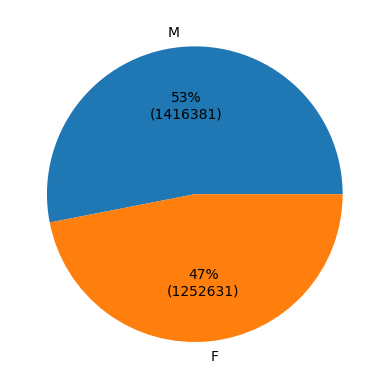

In [ ]:
d_counts = df_3['GENDER'].value_counts()
d_table = d_counts.reset_index()
d_table.columns = ['GENDER', 'Count']  # Rename columns appropriately

counts = d_table['Count']
labels = d_table['GENDER']

def make_autopct(counts):
    def my_autopct(pct):
        total = sum(counts)
        val = int(round(pct*total/100.0))
        return '{p:.0f}%\n({v:d})'.format(p=pct, v=val)
    return my_autopct

plt.pie(counts, labels=labels, autopct=make_autopct(counts))
plt.show()

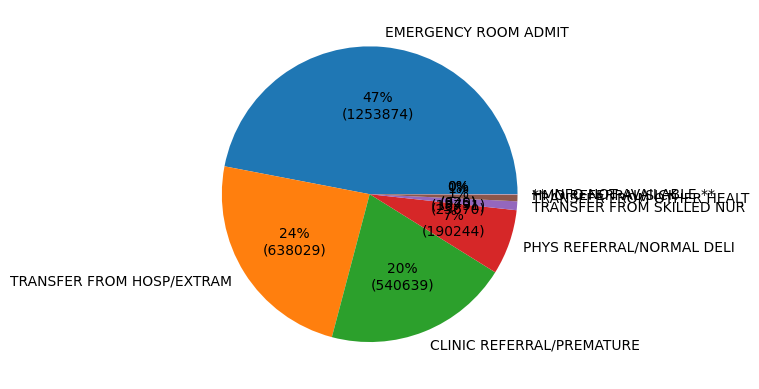

In [ ]:
d_counts = df_3['ADMISSION_LOCATION'].value_counts()
d_table = d_counts.reset_index()
d_table.columns = ['ADMISSION_LOCATION', 'Count']  # Rename columns appropriately

counts = d_table['Count']
labels = d_table['ADMISSION_LOCATION']

def make_autopct(counts):
    def my_autopct(pct):
        total = sum(counts)
        val = int(round(pct*total/100.0))
        return '{p:.0f}%\n({v:d})'.format(p=pct, v=val)
    return my_autopct

plt.pie(counts, labels=labels, autopct=make_autopct(counts))
plt.show()

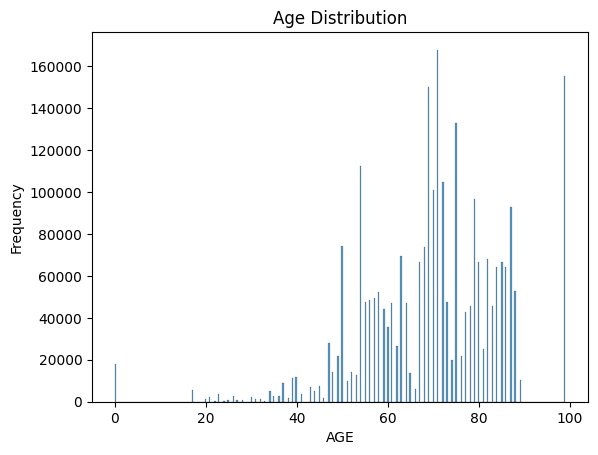

In [ ]:
sns.histplot(df_3['AGE'])
plt.title('Age Distribution')
plt.ylabel('Frequency')
plt.show()

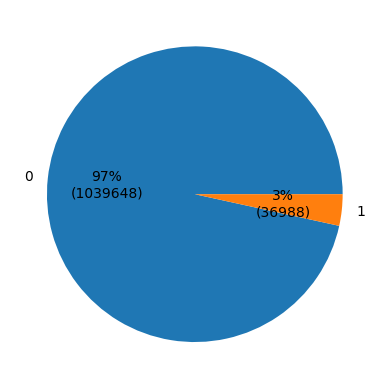

In [ ]:
d_counts = df_3['WARNING'].value_counts()
d_table = d_counts.reset_index()
d_table.columns = ['WARNING', 'Count']  # Rename columns appropriately

counts = d_table['Count']
labels = d_table['WARNING']

def make_autopct(counts):
    def my_autopct(pct):
        total = sum(counts)
        val = int(round(pct*total/100.0))
        return '{p:.0f}%\n({v:d})'.format(p=pct, v=val)
    return my_autopct

plt.pie(counts, labels=labels, autopct=make_autopct(counts))
plt.show()

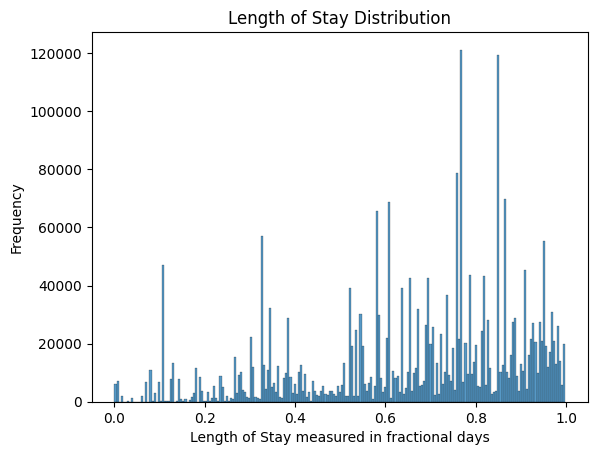

In [ ]:
sns.histplot(df_3['LOS'])
plt.title('Length of Stay Distribution')
plt.xlabel('Length of Stay measured in fractional days')
plt.ylabel('Frequency')
plt.show()

#4. Interactive Widget

In [ ]:
from google.colab import output
output.enable_custom_widget_manager()

In [ ]:
import ipywidgets as widgets
import plotly.graph_objects as go
from IPython.display import display

# Create input widgets
input_widgets = widgets.VBox([
    widgets.FloatText(description="Blood Urea Nitrogen (mg/dL)", placeholder="Enter value", style={'description_width': '200px'}),
    widgets.FloatText(description="Creatinine (mg/dL)", placeholder="Enter value", style={'description_width': '200px'}),
    widgets.FloatText(description="Age", placeholder="Enter value", style={'description_width': '200px'}),
    widgets.FloatText(description="Max Blood Pressure (mmHg)", placeholder="Enter value", style={'description_width': '200px'}),
    widgets.FloatText(description="Platelet Count (mcL/1000)", placeholder="Enter value", style={'description_width': '200px'}),
    widgets.FloatText(description="Hemoglobin (g/dL)", placeholder="Enter value", style={'description_width': '200px'})
])

# Create a button widget
button_widget = widgets.Button(description="Predict")

# Create an output widget
output_widget = go.FigureWidget(
    data=[go.Table(
        header=dict(values=["Feature", "Value"]),
        cells=dict(values=[[], []])
    )],
    layout=go.Layout(
        title="Prediction Result",
        width=400,
        height=600
    )
)

# Define the button click event handler
def on_button_click(b):
    try:
        BUN = input_widgets.children[0].value
        Creatinine = input_widgets.children[1].value
        AGE = input_widgets.children[2].value
        value = input_widgets.children[3].value
        Platelet_Count = input_widgets.children[4].value
        Hemoglobin = input_widgets.children[5].value

        X_new = pd.DataFrame([[BUN, Creatinine, AGE, value, Platelet_Count, Hemoglobin]],
                             columns=['BUN', 'Creatinine', 'AGE', 'value', 'Platelet Count', 'Hemoglobin'])

        y_pred = gradient_boosting_regressor.predict(X_new)
        los_days = y_pred[0]

        y_pred_classifier = gradient_boosting_model.predict(X_new)
        outcome = 'Death' if y_pred_classifier[0] == 1 else 'Live'

        # Update the output widget with feature descriptions, values, LOS, and predicted outcome
        output_widget.data[0].cells.values = [
            [widget.description for widget in input_widgets.children] + ["LOS (Length of Stay)", "Predicted Outcome"],
            [widget.value for widget in input_widgets.children] + [f"{los_days:.2f} days", outcome]
        ]
    except ValueError:
        output_widget.data[0].cells.values = [
            ["Invalid input. Please enter valid numerical values."],
            [""]
        ]

# Attach the button click event handler
button_widget.on_click(on_button_click)

# Display the widgets
display(input_widgets)
display(button_widget)
display(output_widget)

Button(description='Predict', style=ButtonStyle())

FigureWidget({
    'data': [{'cells': {'values': [[], []]},
              'header': {'values': ['Feature', 'Value']},
              'type': 'table',
              'uid': 'fa1f5469-8ee9-421a-8051-e1ec57bd1c31'}],
    'layout': {'height': 600, 'template': '...', 'title': {'text': 'Prediction Result'}, 'width': 400}
})